# Python API

You can use polarityjam within python to do your analysis. A good tool to get an impression for the data you are about to analyse is jupyter notebook https://jupyter.org/). Paired with python micromamba and conda-forge it is a powerful option. The following will show how to use polarityjam in a python shell, or preferably in a jupyter notebook. What follows is an example of such a notebook. It can be found [here!](https://github.com/polarityjam/polarityjam/blob/main/docs/notebooks/polarityjam-notebook.ipynb)

Lets first look at the API. There is four major parts to it:
- Parameter
- Segmentation
- Extraction
- Visualization

We will walk you through each of them in here. First, familiarize with the API structure.

![python api](../images/api.png "Python API")


In [63]:
# must run in an environment where polarityJaM is installed
from polarityjam import Extractor, Plotter, PropertiesCollection
from polarityjam import RuntimeParameter, PlotParameter, SegmentationParameter, ImageParameter, SegmentationMode
from polarityjam import PolarityJamLogger
from polarityjam import load_segmenter
from polarityjam.utils.io import read_image

from pathlib import Path

In [64]:
# Setup a logger to only report WARNINGS, Put "INFO" or "DEBUG" to get more information
plog = PolarityJamLogger("WARNING")

## Parameter

First, lets setup the data we want to use and the parameters describing what we want to do. You find the images in our example dataset that are part of Polarity-JaM.
Here is the link to the [example data!](https://github.com/polarityjam/polarityjam/blob/main/src/polarityjam/test/resources/data.zip) Simply extract the zip and have it in the same directory as this notebook.

In [65]:
### ADAPT ME ###
path_root = Path("")
input_file = path_root.joinpath("data/golgi_nuclei/set_2/060721_EGM2_18dyn_02.tif")
output_path = path_root.joinpath("polarityjam_out/")
output_file_prefix = "060721_EGM2_18dyn_02"
### ADAPT ME ###

An image can be read in and needs to be further specified which channels hold what kind of information. For that the `ImageParameter` class should be used.

In [66]:
# read input
img = read_image(input_file)

# describe your image with ImageParameter
params_image = ImageParameter()

# set the channels
params_image.channel_organelle = 0  # golgi channel
params_image.channel_nucleus = 2
params_image.channel_junction = 3
params_image.channel_expression_marker = 3
params_image.pixel_to_micron_ratio = 2.4089

print(params_image)

ImageParameter:  
channel_junction              3                                       
channel_nucleus               2                                       
channel_organelle             0                                       
channel_expression_marker     3                                       
pixel_to_micron_ratio         2.4089                                  



Other parameters that should now be specified are `RuntimeParameter`, `PlotParameter`.

In [67]:
# define other parameters, use default values
params_runtime = RuntimeParameter()
params_plot = PlotParameter()

Let's look at our parameter default values:

In [68]:
print(params_runtime)
print(params_plot)

RuntimeParameter:  
extract_group_features        False                                   
extract_morphology_features   True                                    
extract_polarity_features     True                                    
extract_intensity_features    True                                    
membrane_thickness            5                                       
junction_threshold            -1                                      
feature_of_interest           cell_area                               
min_cell_size                 50                                      
min_nucleus_size              10                                      
min_organelle_size            10                                      
dp_epsilon                    5                                       
cue_direction                 0                                       
connection_graph              True                                    
segmentation_algorithm        CellposeSegmenter          

Changing an of these is easy - and can be done as shown below:

In [69]:
params_plot.dpi = 200

In [70]:
# change some parameters
params_runtime.membrane_thickness = 6
params_runtime.min_organelle_size = 9

to see all possible parameters and what values they can take see the Usage section of the documentation.

### All parameters from single file

Because there are a lot of parameters to set, we can also load all parameters from a single file. For every parameter that is not content of this file the default value is automatically taken. The code would look like this:

<div class="alert alert-info">

Note

Order of your notebook cells matters! Parameters defined in previous cells could be overwritten by the parameters defined in the yml-file.

</div>

In [71]:
### CHANGE ME ###
path_to_yml = "/path/to/your/yml/file.yml"
### CHANGE ME ###

#params_image = ImageParameter.from_yml(path_to_yml)
#params_runtime = RuntimeParameter.from_yml(path_to_yml)
#params_plot = PlotParameter.from_yml(path_to_yml)
#params_seg = SegmentationParameter.from_yml(path_to_yml)  # default segmentation algorithm is used if not specified in yml

## Segmentation

Before features can be extracted the image must be segmented. A segmentation procedure in polarityJaM consists of two steps. First, the image is prepared for segmentation. Second, the segmentation algorithm is applied to the prepared image.

You can specify the segmentation algorithm in the `RuntimeParameter`.
Here, you can change the value of `segmentation_algorithm` if you want to use a different algorithm. Default value is `CellposeSegmenter` and hence the cellpose segmentation algorithm will be used.




In [72]:
print("Used algorithm for segmentation: %s " % params_runtime.segmentation_algorithm)

Used algorithm for segmentation: CellposeSegmenter 


In [73]:
# Now define your segmenter and segment your image with the default algorithm and default parameters.
cellpose_segmentation, _ = load_segmenter(params_runtime)

# prepare your image for segmentation
img_prepared, img_prepared_params = cellpose_segmentation.prepare(img, params_image)

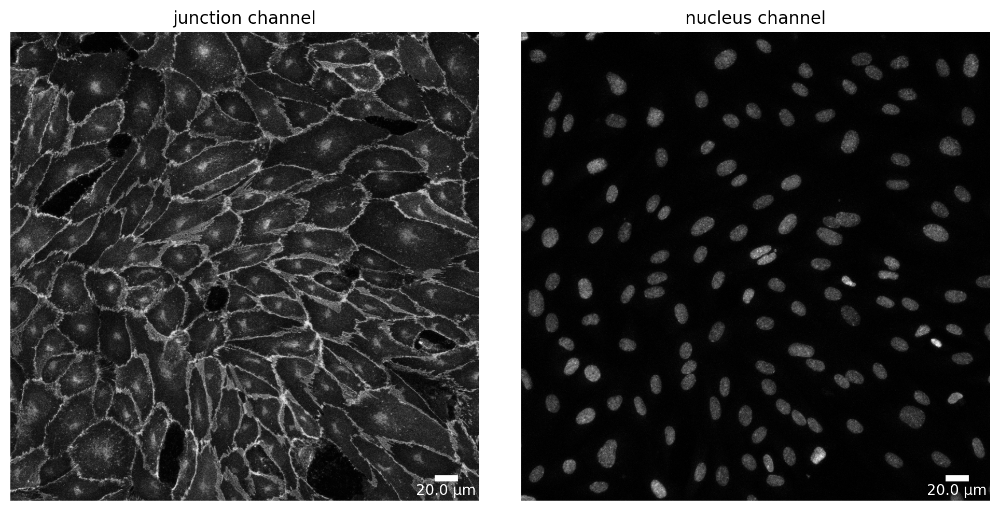

In [74]:
# Define a plotter and check your for segmentation prepared image
plotter = Plotter(params_plot)

# plot input
plotter.plot_channels(img_prepared, img_prepared_params, output_path, input_file);

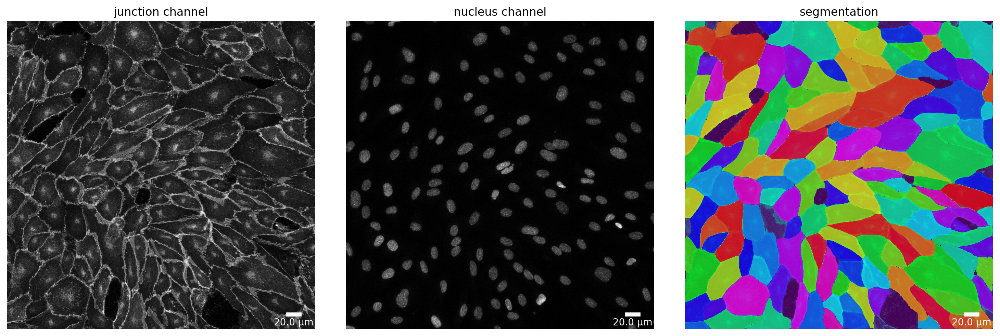

In [75]:
# now segment your prepared image to get the masks
mask = cellpose_segmentation.segment(img_prepared, input_file)

# plot segmentation mask to check the quality
plotter.plot_mask(mask, img_prepared, img_prepared_params, output_path, output_file_prefix);

## Change segmentation parameters

To specify the parameters of the segmentation algorithm, you can use the `SegmentationParameter` class. But if not defined otherwise, the segmentation algorithm is used with its default parameters. Parameter that are of no use for the segmentation algorithm are ignored during segmentation, but no error is thrown. Make sure to check the parameters of the segmentation algorithm you are using.


In [76]:
# define your segmentation parameters by starting with the default parameters
cellpose_parameter = SegmentationParameter(params_runtime.segmentation_algorithm)

# change specific parameters
cellpose_parameter.estimated_cell_diameter = 300

print(cellpose_parameter)

SegmentationParameter:  
path                          cellpose.CellposeSegmenter              
channel_cell_segmentation                                             
channel_nuclei_segmentation                                           
manually_annotated_mask                                               
store_segmentation            False                                   
use_given_mask                True                                    
model_type                    cyto                                    
model_type_nucleus            nuclei                                  
model_path                                                            
estimated_cell_diameter       300                                     
estimated_nucleus_diameter    30                                      
flow_threshold                0.4                                     
cellprob_threshold            0.0                                     
use_gpu                       False                 

In [77]:
# now lets load the segmenter with the new parameters
cellpose_segmentation_altered_params, _ = load_segmenter(params_runtime, cellpose_parameter)

# using this `cellpose_segmentation_altered_params` to prepare your image and segment it would now use the altered parameters!
# img_prepared_altered, _ = cellpose_segmentation_altered_params.prepare(img, params_image)
# mask_altered = cellpose_segmentation.segment(img_prepared_altered, input_file)

## Change segmentation algorithm

You might notice that the segmentation algorithm you are using performs poor on your data.
Try different segmentation algorithms to find the one that works best for you.

For a list of included segmentation algorithms please look at the Usage page of the documentation.

We now show you how you can change the segmentation algorithm:

<div class="alert alert-info">

Note

Different segmentation algorithms might need different parameters. Make sure to check the parameters of the segmentation algorithm you are using.

</div>

In [78]:
params_runtime.segmentation_algorithm = "DeepCellSegmenter"

deepcell_segmenter_parameters = SegmentationParameter(params_runtime.segmentation_algorithm)
deepcell_segmenter_parameters.segmentation_mode = "nuclear"

print(deepcell_segmenter_parameters)

SegmentationParameter:  
path                          deepcell.DeepCellSegmenter              
channel_cell_segmentation                                             
channel_nuclei_segmentation                                           
segmentation_mode             nuclear                                 
save_mask                     False                                   
maxima_threshold              0.18                                    
maxima_smooth                 0.1                                     
interior_threshold            0.1                                     
interior_smooth               0.2                                     
small_objects_threshold       25.0                                    
fill_holes_threshold          5.0                                     
radius                        20.0                                    
pixel_expansion               0                                       



We changed the segmentation algorithm to DeepCell and the mode to \"nuclear\" to get a nucleus segmentation instead of a whole cell segmentation since Cellpose does already a great job. Next steps are now analog to segmenting cells: prepare and segment your image!

<div class="alert alert-info">

Note

When you use a new segmentation algorithm for the first time, it needs to be installed. This can take a while. Please be patient.

</div>

In [79]:
### This might take a while ###
deepcell_segmentation, _ = load_segmenter(params_runtime, deepcell_segmenter_parameters)

# again, prepare your image for segmentation
img_prepared_deepcell, img_prepared_deepcell_params = deepcell_segmentation.prepare(img, params_image)

# again, segment your prepared image to get the nucleus instance masks - this time using the DeepCellSegmenter and SegmentationMode NUCLEUS
mask_deepcell = deepcell_segmentation.segment(img_prepared_deepcell, mode=SegmentationMode.NUCLEUS);

### This might take a while ###

13:46:18 INFO    

Solution credits:

Noah F. Greenwald and Geneva Miller and Erick Moen and Alex Kong and Adam Kagel and Thomas Dougherty and Christine Camacho Fullaway and Brianna J. McIntosh and Ke Xuan Leow and Morgan Sarah Schwartz and Cole Pavelchek and Sunny Cui and Isabella Camplisson and Omer Bar-Tal and Jaiveer Singh and Mara Fong and Gautam Chaudhry and Zion Abraham and Jackson Moseley and Shiri Warshawsky and Erin Soon and Shirley Greenbaum and Tyler Risom and Travis Hollmann and Sean C. Bendall and Leeat Keren and William Graf and Michael Angelo and David Van Valen; Whole-cell segmentation of tissue images with human-level performance using large-scale data annotation and deep learning (DOI: https://doi.org/10.1038/s41587-021-01094-0)


13:46:19 INFO    ~ Starting DeepCell-predict
13:46:19 INFO    ~ 2025-04-16 13:46:19.636650: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cann

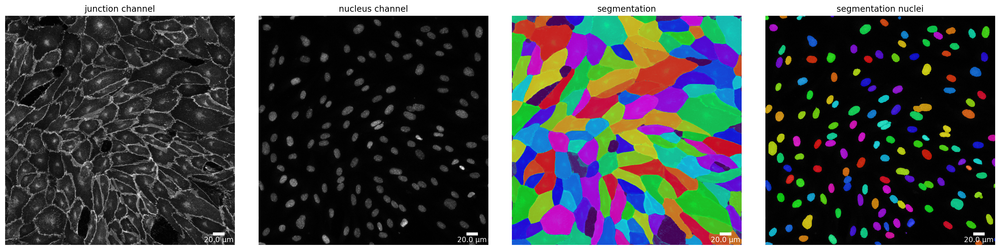

In [80]:
# plot segmentation mask to check the quality
plotter.plot_mask(mask, img_prepared_deepcell, img_prepared_deepcell_params, output_path, output_file_prefix, mask_nuclei=mask_deepcell);

## Feature extraction

Use the `Extractor` class to extract the features from your segmentation. Please provide the original image and not the image that is created in the preparation step of the segmentation.

In [81]:
# feature extraction
collection = PropertiesCollection()
extractor = Extractor(params_runtime)
extractor.extract(img, params_image, mask, output_file_prefix, output_path, collection, segmentation_mask_nuclei=mask_deepcell);

In [82]:
collection.dataset.head()

,filename,img_hash,label,cell_X,cell_Y,cell_shape_orientation_rad,cell_shape_orientation_deg,cell_cue_direction_symmetry,cell_major_axis_length,cell_minor_axis_length,...,junction_interface_linearity_index,junction_interface_occupancy,junction_intensity_per_interface_area,junction_cluster_density,junction_centroid_orientation_rad,junction_centroid_orientation_deg,junction_cue_directional_intensity_ratio,junction_cue_axial_intensity_ratio,junction_mean_expression,junction_protein_intensity
1,060721_EGM2_18dyn_02,363944ca78d06717742fe4dbe142e026e325f48d,11.0,720.508294,45.513774,3.124644,179.028931,0.801838,147.191605,60.249653,...,1.055778,0.591342,267.056168,451.610016,5.464859,313.113383,0.109910,0.541312,324.822479,1.036445e+06
2,060721_EGM2_18dyn_02,363944ca78d06717742fe4dbe142e026e325f48d,12.0,58.043105,55.697915,3.113451,178.387603,0.744707,98.194399,77.941589,...,1.075794,0.553699,195.988552,353.962555,3.763877,215.654293,-0.286112,0.551979,247.426178,6.332390e+05
3,060721_EGM2_18dyn_02,363944ca78d06717742fe4dbe142e026e325f48d,13.0,619.535898,69.791661,2.815969,161.343146,0.724643,102.410029,88.514931,...,1.074227,0.605893,214.662784,354.291779,2.121826,121.571667,-0.155887,0.392231,265.672974,7.358640e+05
4,060721_EGM2_18dyn_02,363944ca78d06717742fe4dbe142e026e325f48d,14.0,176.616147,104.956727,0.408647,23.413770,0.724900,185.249457,143.634939,...,1.078673,0.400356,163.364451,408.048096,4.127899,236.511168,-0.255170,0.512134,227.133942,1.009919e+06
5,060721_EGM2_18dyn_02,363944ca78d06717742fe4dbe142e026e325f48d,15.0,823.013250,71.744770,2.500474,143.266594,0.654023,72.316774,51.889923,...,1.075565,0.796763,363.425354,456.127533,2.271045,130.121279,0.001117,0.538820,397.937958,8.082580e+05


In [83]:
collection.dataset.to_csv(output_path.joinpath('features.csv'))

## Visualization

At each point in the analysis process visualization is necessary for quality control! Use the Plotter class to look at processing steps.


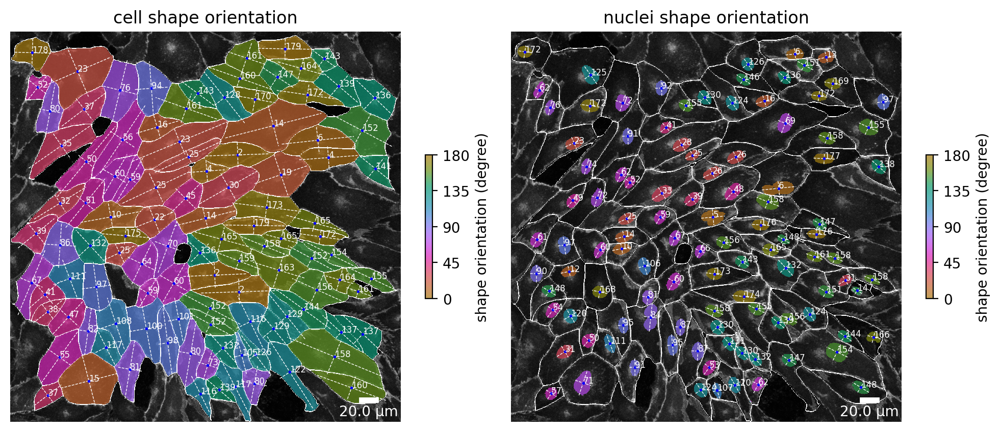

In [84]:
# plot the cell orientation of a specific image in your collection
plotter.plot_shape_orientation(collection, "060721_EGM2_18dyn_02");  # image is automatically saved in output_path

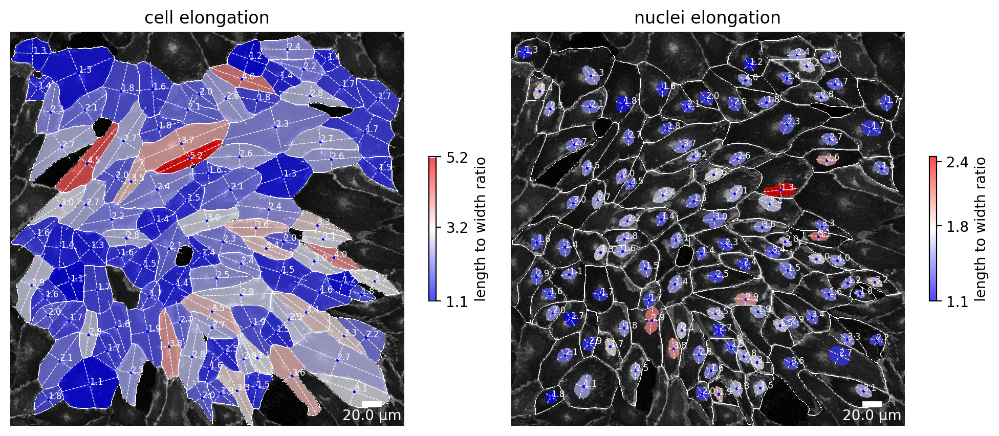

In [85]:
plotter.plot_length_to_width_ratio(collection, "060721_EGM2_18dyn_02");

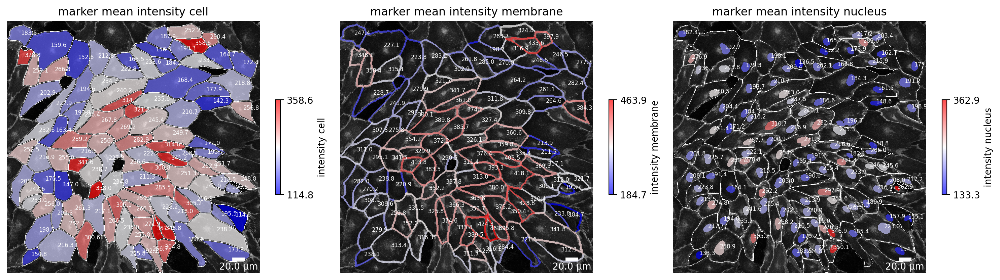

In [86]:
plotter.plot_marker_expression(collection, "060721_EGM2_18dyn_02");

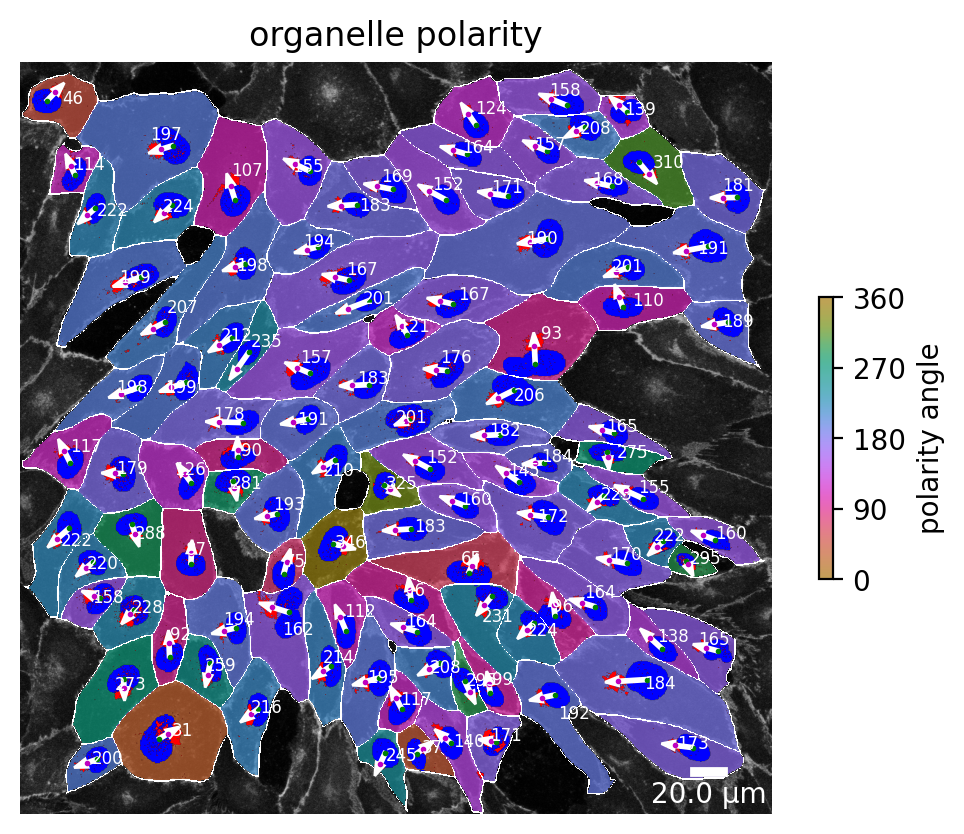

In [87]:
plotter.plot_organelle_polarity(collection, "060721_EGM2_18dyn_02");

Or simply plot the whole collection!

<div class="alert alert-info">

Note

This produces several plots for each image in the collection! Runtime can be high!

</div>


In [ ]:
# or simply plot the whole collection
plotter.plot_collection(collection);

# Output omitted, see Visualization section of the documentation for an overview of the available plots